In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#!/bin/bash
! kaggle datasets download mohitsingh1804/plantvillage

Dataset URL: https://www.kaggle.com/datasets/mohitsingh1804/plantvillage
License(s): GPL-2.0
 84% 689M/818M [00:03<00:02, 53.7MB/s]
100% 818M/818M [00:03<00:00, 215MB/s] 


In [ ]:
import zipfile
zip_ref = zipfile.ZipFile('/content/plantvillage.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
from keras.preprocessing import image_dataset_from_directory

In [ ]:
dataset = image_dataset_from_directory(
    directory = '/content/PlantVillage/train' ,
    batch_size = 64 ,
    seed = 12 ,
    image_size = [224 , 224] ,
    shuffle = True
)

Found 43444 files belonging to 38 classes.


In [ ]:
len(dataset)

679

In [ ]:
name = dataset.class_names

In [ ]:
len(name)

38

In [ ]:
train_df = image_dataset_from_directory(
    directory = '/content/PlantVillage/train' ,
    batch_size = 64 ,
    seed = 12 ,
    image_size = [224 , 224] ,
    shuffle = True
)

Found 43444 files belonging to 38 classes.


In [ ]:
val_df = image_dataset_from_directory(
    directory = '/content/PlantVillage/val' ,
    batch_size = 64 ,
    seed = 12 ,
    image_size = [224 , 224] ,
    shuffle = True
)

Found 10861 files belonging to 38 classes.


In [ ]:
len(train_df)

679

In [ ]:
len(val_df)

170

# Making a Data Augmentation

In [ ]:
from keras.models import *
from keras.layers import *

In [ ]:
augment = Sequential([
    RandomFlip('horizontal_and_vertical') ,
    RandomZoom(0.2) ,
    RandomContrast(0.2) ,
    RandomRotation(0.2)
])

In [ ]:
train_df = train_df.map(lambda x ,y : (augment(x, training = True), y))

# Normalize

In [ ]:
normalize = Sequential([
    Resizing(255 , 255) ,
    Rescaling(1./255)
])

In [ ]:
train_df = train_df.map(lambda x, y : (normalize(x),y))

val_df = val_df.map(lambda x, y : (normalize(x),y))

# Making a base model

In [ ]:
from keras.applications import *

In [ ]:
train_df

<_MapDataset element_spec=(TensorSpec(shape=(None, 255, 255, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
base_model = ResNet50V2(
    include_top = False ,
    input_shape = (255, 255 , 3) ,
    weights = 'imagenet'
)

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
base_model.trainable = False

# Making a Model

In [ ]:
input = Input(shape = (255 , 255 , 3))

x = base_model(input , training = False)

gap = GlobalAveragePooling2D()(x)

d = Dropout(0.3)(gap)

d1 = Dense(512 , activation = 'relu')(d)
d2 = Dense(512 , activation = 'relu')(d1)
o = Dense(len(name), activation = 'softmax')(d2)

model = Model(inputs = input , outputs = o)

In [ ]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 255, 255, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 8, 8, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,896,038 (94.97 MB)

 Trainable params: 1,331,238 (5.08 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

# Compilling Model

In [ ]:
from keras.losses import *
from keras.optimizers import *

In [ ]:
model.compile(optimizer = Adam(1e-3), loss = SparseCategoricalCrossentropy(from_logits = False), metrics = ['accuracy'])

# Callbacks

In [ ]:
from keras.callbacks import *

In [ ]:
es = EarlyStopping(monitor = 'val_loss', patience = 3 , restore_best_weights = True)

In [ ]:
ls = ReduceLROnPlateau(monitor = 'val_loss', patience = 3 , factor = 0.3)

 # Model Fitting

In [ ]:
model.fit(train_df ,validation_data =  val_df , epochs =6 , batch_size = 128 , callbacks = [es , ls] , verbose = 1 )

Epoch 1/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 703s 1s/step - accuracy: 0.7995 - loss: 0.6369 - val_accuracy: 0.8934 - val_loss: 0.3139 - learning_rate: 0.0010
Epoch 2/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 684s 1s/step - accuracy: 0.8681 - loss: 0.3950 - val_accuracy: 0.9113 - val_loss: 0.2778 - learning_rate: 0.0010
Epoch 3/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 740s 1s/step - accuracy: 0.8902 - loss: 0.3327 - val_accuracy: 0.9130 - val_loss: 0.2432 - learning_rate: 0.0010
Epoch 4/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 682s 1s/step - accuracy: 0.8990 - loss: 0.3048 - val_accuracy: 0.9319 - val_loss: 0.2048 - learning_rate: 0.0010
Epoch 5/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 684s 1s/step - accuracy: 0.9030 - loss: 0.2863 - val_accuracy: 0.9305 - val_loss: 0.2044 - learning_rate: 0.0010
Epoch 6/6
679/679 ━━━━━━━━━━━━━━━━━━━━ 684s 1s/step - accuracy: 0.9116 - loss: 0.2636 - val_accuracy: 0.9374 - val_loss: 0.1854 - learning_rate: 0.0010


In [ ]:
# Saving our Class Name

import json
class_names = name   # from dataset.class_names
with open("class_names.json", "w") as f:
    json.dump(class_names, f)


2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step


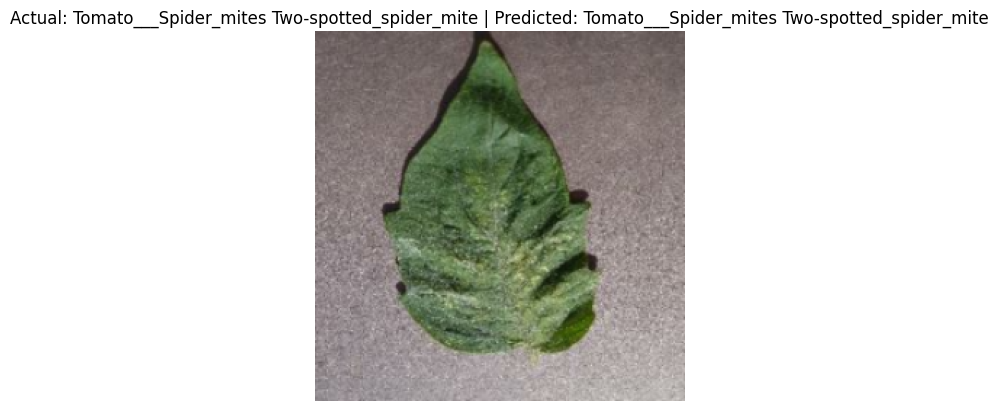

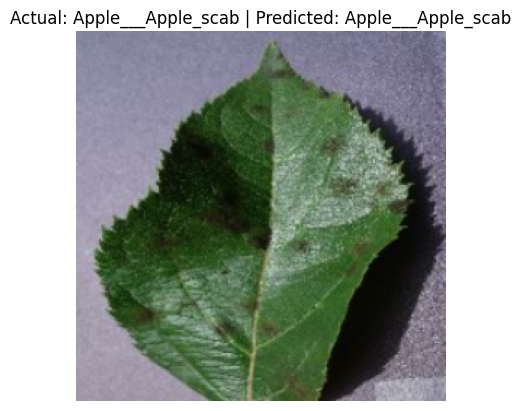

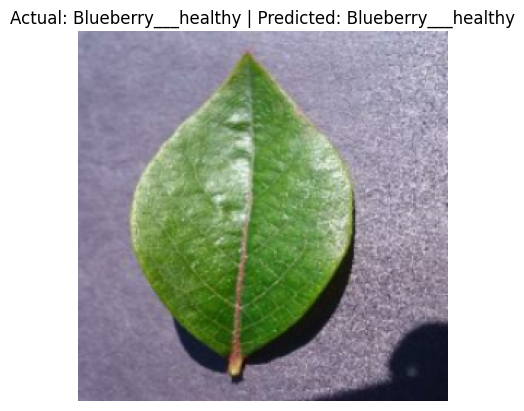

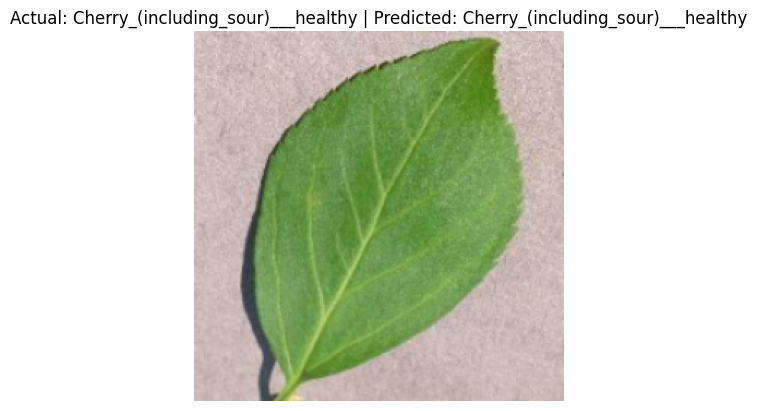

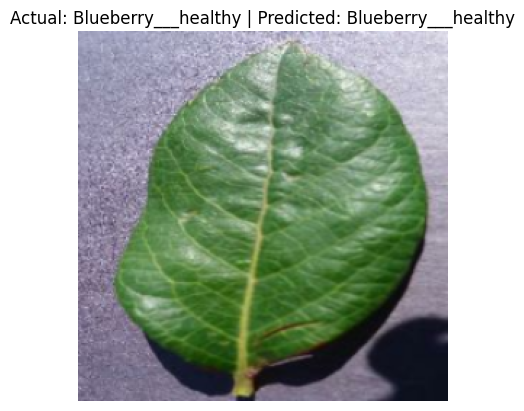

...

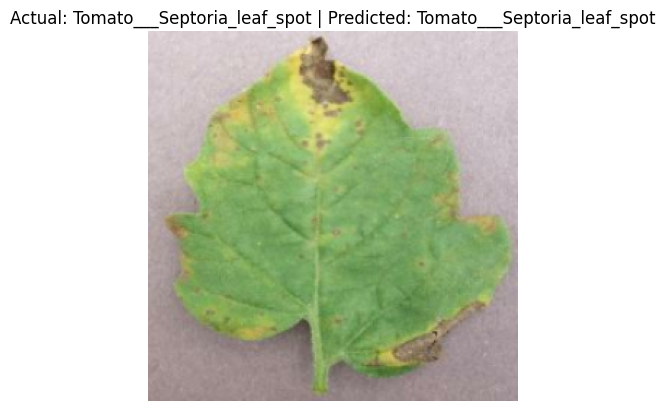

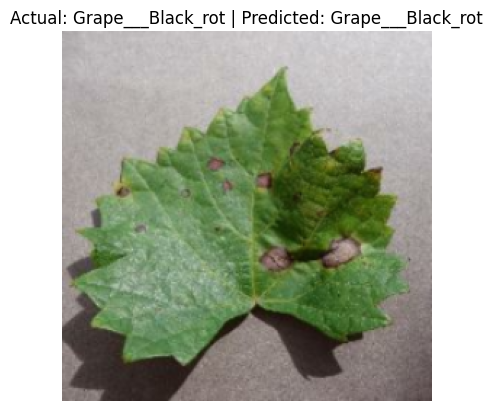

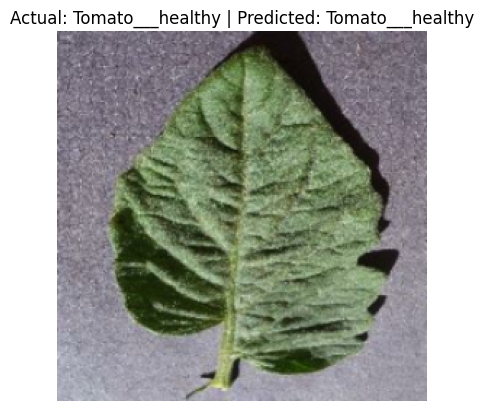

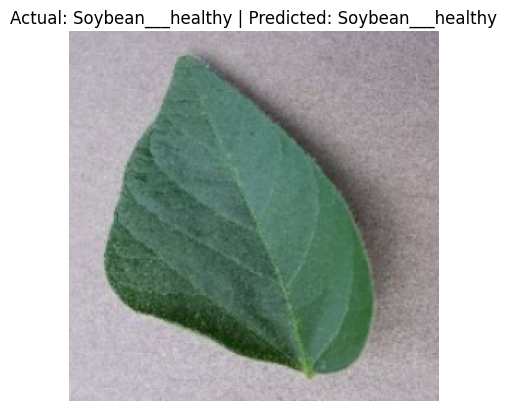

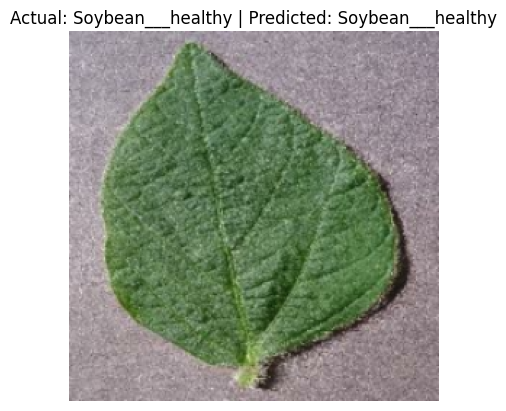

Total Samples = 64
Correct Predictions = 62
Final Accuracy = 0.96875


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

correct = 0
total = 0

for images, labels in val_df.take(1):   # val_df = your test dataset
    # Predict on the batch
    preds = model.predict(images)

    # Loop through each image inside the batch
    for i in range(len(images)):
        actual_label = name[int(labels[i].numpy())]
        predicted_class = np.argmax(preds[i])
        predicted_label = name[predicted_class]

        # Accuracy count
        if actual_label == predicted_label:
            correct += 1
        total += 1

        # Show image + prediction
        plt.imshow(images[i].numpy())
        plt.title(f"Actual: {actual_label} | Predicted: {predicted_label}")
        plt.axis("off")
        plt.show()


# FINAL ACCURACY
print("Total Samples =", total)
print("Correct Predictions =", correct)
print("Final Accuracy =", correct / total)

# Fine Tunning

In [ ]:
for layer in model.layers[-40:]:
  layer.trainable = True

In [ ]:
model.compile(optimizer = Adam(1e-5), loss = SparseCategoricalCrossentropy(from_logits = False), metrics = ['accuracy'])

In [ ]:
model.fit(train_df , validation_data = val_df , epochs = 6 , batch_size = 128 , verbose = 1 , callbacks = [es , ls])

In [ ]:
model.save('day_6_plant_village_model.h5')
model.save('day_6_plant_village_model.keras')